In [1]:
import torch
import torch.nn as nn
from torchvision import models
from torch.nn.functional import relu
from torchsummary import summary
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt 
import numpy as np
import os


In [2]:
class UNetDenoise(nn.Module):
    #layers definition
    def __init__(self): #constructor for uNetDenoise
        super().__init__() #constructor of parent class to init inherited attributes
        #Encoder portion, with 256x256x3 input. Padding: same for 3x3 convolutions

        #1st downsample layer
        self.conv11 = nn.Conv2d(1,64,kernel_size=3, padding=1) #dataset images are black and white
        self.conv12 = nn.Conv2d(64,64, kernel_size=3, padding=1) #keep padding same, (kernselSize-1)/2
        self.pool1=nn.MaxPool2d(kernel_size=2, stride=2)

        #2nd downsample layer
        self.conv21 = nn.Conv2d(64,128,kernel_size=3, padding=1)
        self.conv22 = nn.Conv2d(128,128,kernel_size=3, padding=1)
        self.pool2=nn.MaxPool2d(kernel_size=2, stride=2)

        #3rd downsample layer
        self.conv31 = nn.Conv2d(128,256,kernel_size=3, padding=1)
        self.conv32 = nn.Conv2d(256,256,kernel_size=3, padding=1)
        self.pool3=nn.MaxPool2d(kernel_size=2, stride=2)

        #4th downsample layer
        self.conv41 = nn.Conv2d(256,512,kernel_size=3, padding=1)
        self.conv42 = nn.Conv2d(512,512,kernel_size=3, padding=1)
        self.pool4=nn.MaxPool2d(kernel_size=2, stride=2)

        #bottle neck
        self.conv51 = nn.Conv2d(512,1024,kernel_size=3, padding=1)
        self.conv52 = nn.Conv2d(1024,1024,kernel_size=3, padding=1)

        #upsample 1
        self.upconv1 = nn.ConvTranspose2d(1024,512,kernel_size=2,stride=2) #1024, but half 
        self.u11 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        self.u12 = nn.Conv2d(512, 512, kernel_size=3, padding=1)

        #upsample 2
        self.upconv2 = nn.ConvTranspose2d(512,256,kernel_size=2,stride=2)
        self.u21 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.u22 = nn.Conv2d(256, 256, kernel_size=3, padding=1)

        #upsample 3
        self.upconv3 = nn.ConvTranspose2d(256,128,kernel_size=2,stride=2)
        self.u31 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.u32 = nn.Conv2d(128, 128, kernel_size=3, padding=1)

        #upsample 4
        self.upconv4 = nn.ConvTranspose2d(128,64,kernel_size=2,stride=2)
        self.u41 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.u42 = nn.Conv2d(64, 1, kernel_size=3, padding=1)

    def forward(self, x):
        #encoder forward
        xconv11 = relu(self.conv11(x))
        xconv12 = relu(self.conv12(xconv11))
        xpool1 = self.pool1(xconv12)

        xconv21 = relu(self.conv21(xpool1))
        xconv22 = relu(self.conv22(xconv21))
        xpool2 = self.pool2(xconv22)

        xconv31 = relu(self.conv31(xpool2))
        xconv32 = relu(self.conv32(xconv31))
        xpool3 = self.pool3(xconv32)

        xconv41 = relu(self.conv41(xpool3))
        xconv42 = relu(self.conv42(xconv41))
        xpool4 = self.pool4(xconv42)

        xconv51 = relu(self.conv51(xpool4))
        xconv52 = relu(self.conv52(xconv51))

        #decoder forward 
        xup1 = self.upconv1(xconv52)
        xu11 = torch.cat([xup1, xconv42], dim=1)
        xd11 = relu(self.u11(xu11))
        xd12 = relu(self.u12(xd11))

        xup2 = self.upconv2(xd12)
        xu22 = torch.cat([xup2, xconv32], dim=1)
        xd21 = relu(self.u21(xu22))
        xd22 = relu(self.u22(xd21))

        xup3 = self.upconv3(xd22)
        xu33 = torch.cat([xup3, xconv22], dim=1)
        xd31 = relu(self.u31(xu33))
        xd32 = relu(self.u32(xd31))

        xup4 = self.upconv4(xd32)
        xu44 = torch.cat([xup4, xconv12], dim=1)
        xd41 = relu(self.u41(xu44))
        xd42 = relu(self.u42(xd41))

        return xd42

        

In [3]:
model1 = UNetDenoise()
summary(model1, (1, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
├─Conv2d: 1-1                            [-1, 64, 256, 256]        640
├─Conv2d: 1-2                            [-1, 64, 256, 256]        36,928
├─MaxPool2d: 1-3                         [-1, 64, 128, 128]        --
├─Conv2d: 1-4                            [-1, 128, 128, 128]       73,856
├─Conv2d: 1-5                            [-1, 128, 128, 128]       147,584
├─MaxPool2d: 1-6                         [-1, 128, 64, 64]         --
├─Conv2d: 1-7                            [-1, 256, 64, 64]         295,168
├─Conv2d: 1-8                            [-1, 256, 64, 64]         590,080
├─MaxPool2d: 1-9                         [-1, 256, 32, 32]         --
├─Conv2d: 1-10                           [-1, 512, 32, 32]         1,180,160
├─Conv2d: 1-11                           [-1, 512, 32, 32]         2,359,808
├─MaxPool2d: 1-12                        [-1, 512, 16, 16]         --
├─Conv2d: 1-13                           [-1, 1

Layer (type:depth-idx)                   Output Shape              Param #
├─Conv2d: 1-1                            [-1, 64, 256, 256]        640
├─Conv2d: 1-2                            [-1, 64, 256, 256]        36,928
├─MaxPool2d: 1-3                         [-1, 64, 128, 128]        --
├─Conv2d: 1-4                            [-1, 128, 128, 128]       73,856
├─Conv2d: 1-5                            [-1, 128, 128, 128]       147,584
├─MaxPool2d: 1-6                         [-1, 128, 64, 64]         --
├─Conv2d: 1-7                            [-1, 256, 64, 64]         295,168
├─Conv2d: 1-8                            [-1, 256, 64, 64]         590,080
├─MaxPool2d: 1-9                         [-1, 256, 32, 32]         --
├─Conv2d: 1-10                           [-1, 512, 32, 32]         1,180,160
├─Conv2d: 1-11                           [-1, 512, 32, 32]         2,359,808
├─MaxPool2d: 1-12                        [-1, 512, 16, 16]         --
├─Conv2d: 1-13                           [-1, 1

In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") #using gpu
print(device)

cuda:0


In [5]:
#dataset

In [6]:
class getDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data = ImageFolder(data_dir, transform=transform) #handles label creation, class names for imgs
        
    def __len__(self): #to let dataloader know len of data
        return len(self.data)
    def __getitem__(self, idx):
        return self.data[idx]
    @property
    def classes(self):
        return self.data.classes

In [7]:
print(os.getcwd())

C:\Users\hanso\Desktop\projects_desktop\UNetDenoiser


In [8]:
#image preprocessing function

In [9]:
preprocess = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((256,256)),
    transforms.ToTensor(),
])

In [10]:
print(os.getcwd())

C:\Users\hanso\Desktop\projects_desktop\UNetDenoiser


In [11]:
train_dir = 'imgDataset/Train400/'
test_dir = 'imgDataset/Test68/'
train_dataset =getDataset(train_dir, preprocess)
test_dataset =getDataset(test_dir, preprocess)

In [12]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [13]:
image, label = train_dataset[0]
image.shape

torch.Size([1, 256, 256])

In [14]:
#training loop

In [15]:
criterion = nn.MSELoss()
optimizer = optim.Adam(model1.parameters(), lr=0.001)

In [16]:
dataset_size = 50
batch_size = 32
num_epochs = 5
model1.to(device)

UNetDenoise(
  (conv11): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv21): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv22): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv31): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv32): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv41): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv42): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv51

In [17]:
model1.train()
for epoch in range(num_epochs):
    curBatch = 0
    lossList = list()
    for images, labels in train_loader:
        curBatch += 1
        clean_images = images.to(device)
        #print(clean_images.shape)
        noisy_images = torch.randn_like(clean_images).to(device)
       
        optimizer.zero_grad()
        outputs = model1(noisy_images)
        # print("outputs shape", outputs.shape)
        # print("clean_imgs shape", clean_images.shape)
        # Compute the loss
        loss = criterion(outputs, clean_images)
        

        loss.backward()
        optimizer.step()
        lossList.append(loss.item())
        
        print(f" Batch: {curBatch} Of: {len(train_loader)}, Loss: {loss.item():.4f}")
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {sum(lossList)/len(lossList):.4f}")

 Batch: 1 Of: 13, Loss: 0.2530
 Batch: 2 Of: 13, Loss: 0.0938
 Batch: 3 Of: 13, Loss: 0.1071
 Batch: 4 Of: 13, Loss: 0.0566
 Batch: 5 Of: 13, Loss: 0.0776
 Batch: 6 Of: 13, Loss: 0.0708
 Batch: 7 Of: 13, Loss: 0.0577
 Batch: 8 Of: 13, Loss: 0.0458
 Batch: 9 Of: 13, Loss: 0.0601
 Batch: 10 Of: 13, Loss: 0.0759
 Batch: 11 Of: 13, Loss: 0.0704
 Batch: 12 Of: 13, Loss: 0.0425
 Batch: 13 Of: 13, Loss: 0.0557
Epoch [1/5], Loss: 0.0821
 Batch: 1 Of: 13, Loss: 0.0532
 Batch: 2 Of: 13, Loss: 0.0661
 Batch: 3 Of: 13, Loss: 0.0522
 Batch: 4 Of: 13, Loss: 0.0520
 Batch: 5 Of: 13, Loss: 0.0446
 Batch: 6 Of: 13, Loss: 0.0514
 Batch: 7 Of: 13, Loss: 0.0486
 Batch: 8 Of: 13, Loss: 0.0518
 Batch: 9 Of: 13, Loss: 0.0529
 Batch: 10 Of: 13, Loss: 0.0521
 Batch: 11 Of: 13, Loss: 0.0674
 Batch: 12 Of: 13, Loss: 0.0538
 Batch: 13 Of: 13, Loss: 0.0667
Epoch [2/5], Loss: 0.0548
 Batch: 1 Of: 13, Loss: 0.0512
 Batch: 2 Of: 13, Loss: 0.0520
 Batch: 3 Of: 13, Loss: 0.0613
 Batch: 4 Of: 13, Loss: 0.0702
 Batch: 5 

In [18]:
#testing model on test set

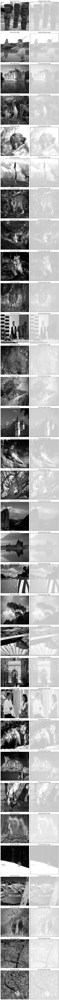

In [ ]:
model1.eval()

# Iterate through the test dataset
for images, labels in test_loader:
    # Move images to the appropriate device
    images = images.to(device)

    # Pass the noisy images through the model to get denoised outputs
    with torch.no_grad():
        denoised_images = model1(images)

    # Convert tensors to numpy arrays and move to CPU
    images = images.cpu().numpy()
    denoised_images = denoised_images.cpu().numpy()

    # Visualize the images
    num_images = len(images)
    fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 5))

    for i in range(num_images):
        # Plot the noisy input image
        axes[i, 0].imshow(images[i].squeeze(), cmap='gray')
        axes[i, 0].set_title('Noisy Input Image')
        axes[i, 0].axis('off')

        # Plot the denoised output image
        axes[i, 1].imshow(denoised_images[i].squeeze(), cmap='gray')
        axes[i, 1].set_title('Denoised Output Image')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()
    break;